<a href="https://colab.research.google.com/github/ikbiz/fullcontrol/blob/master/Lampshade_Maker_250312.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# import python packages (if not already imported)
import sys
if 'fullcontrol' not in sys.modules:
  !pip install git+https://github.com/FullControlXYZ/fullcontrol --quiet
  import fullcontrol as fc
  import lab.fullcontrol as fclab
  from google.colab import files
  from math import sin, cos, pi, tau, log1p
from copy import deepcopy

from math import sin, cos, tau, log1p, pi
import numpy as np
from scipy.interpolate import CubicSpline
# Import the required libraries for visualization
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider, IntSlider,VBox

from scipy.interpolate import splev, splrep

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


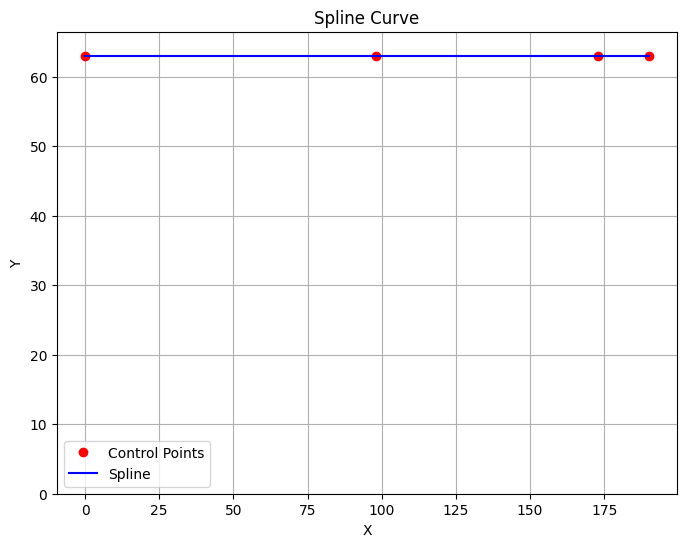

In [ ]:
# Function to draw and generate the spline function
def generate_spline(points_x, points_y):
    # Sort points by x to avoid issues with the spline function
    sorted_points = sorted(zip(points_x, points_y))
    x, y = zip(*sorted_points)

    # Generate the spline using scipy
    tck = splrep(x, y)
    x_fine = np.linspace(min(x), max(x), 500)
    y_fine = splev(x_fine, tck)

    # Plot the spline
    plt.figure(figsize=(8, 6))
    plt.plot(x, y, 'ro', label='Control Points')
    plt.plot(x_fine, y_fine, 'b-', label='Spline')
    # Get current y-axis limits and adjust to include the origin
    ylim = plt.gca().get_ylim()
    plt.ylim(min(0, ylim[0]), max(0, ylim[1]))
    plt.title('Spline Curve')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Return the spline function
    return lambda z: splev(z, tck)

def interactive_spline(p0_y,p1_y, p2_y, p3_y, p4_y):
    points_y = [p0_y, p1_y, p2_y, p3_y, p4_y]
    spline_func = generate_spline(points_x, points_y)
    return spline_func, points_y



# Create sliders for each control point (except the fixed endpoints)
#p0_slider = FloatSlider(value=y_points[1], min=0, max=150, step=1, description='P0 Y')
#p1_slider = FloatSlider(value=y_points[2], min=0, max=150, step=1, description='P1 Y')
#p2_slider = FloatSlider(value=y_points[3], min=0, max=150, step=1, description='P2 Y')
#p3_slider = FloatSlider(value=y_points[4], min=0, max=150, step=1, description='P3 Y')
#p4_slider = FloatSlider(value=y_points[5], min=0, max=150, step=1, description='P4 Y')

# Create an interactive widget
#interact(interactive_spline,p0_y=p0_slider, p1_y=p1_slider, p2_y=p2_slider, p3_y=p3_slider, p4_y=p4_slider);

#points_y_slider = [p0_slider,p1_slider,p2_slider,p3_slider,p4_slider]
# Example control points
x_points = [0,45,55,65,75,85,95,105,115,125,135,145,155,195]
y_points = [62,75,75,75,75,75,75,75,75,75,75,75,75,50]

x_points = [0,80,200,210]
y_points = [60,90,40,38]

x_points = [00,30,40,50,80]
y_points = [45,65,65,63,45]

x_points = [0,10,50,100]
y_points = [63,70,80,20]

x_points = [0,70,100,160,190]
y_points = [63,85,75,30,15]

x_points = [0, 14, 24, 34, 44, 54, 64, 74, 84, 94, 104, 114, 124, 134, 144]
y_points = [63, 80, 84, 87, 89, 90.0, 89, 87, 84, 80, 74, 67, 56, 41, 0.0]

#x_points = [0, 35, 120,180]
#y_points = [63, 80, 80,30]

#x_points = [0,110,195,200]
#y_points = [63,90,36,35]

#x_points = [0,110,190,200]
#y_points = [63,90,40,]

#x_points = [0,10,20,30,40,50,60,120,140,155,160]
#y_points = [115,112,109,106,103,100,97,20.5,20.5,25,27]

#x_points = [0,10,20,30,40,50,110,130,145,150]
#y_points = [112,109,106,103,100,97,20.5,20.5,25,27]

x_points = [0,77,110,144]
y_points = [63,100,80,30]

# Obelisk
x_points = [0,98,173,190]
y_points = [63,63,63,63]


# Generate and display the spline
spline_func = generate_spline(x_points, y_points)

In [ ]:
# Define the percentile (e.g., top 20%)
percentile = 50

# Calculate the threshold value for the given percentile
threshold = np.percentile(y_points, 100 - percentile)

# Filter the array to get the top percentile values
top_percentile_values = [x for x in y_points if x >= threshold]

# Calculate the average of the top percentile values
top_percentile_average = np.mean(top_percentile_values)

expected_wave_length = 4.5 #mm - 4 is good
ideal_wave = pi *  top_percentile_average * 2 / expected_wave_length
print(ideal_wave)

87.96459430051421


In [ ]:
# Define the spline points with realistic values
#x_points = np.array([0, 30, 60, 90, 120, 150])  # Corresponding to z-heights
#y_points = np.array([10, 15, 20, 15, 10, 5])  # Radii in millimeters

#x_points = [0,45,55,65,75,85,95,105,115,125,135,145,155,165,195]
#y_points = [60,75,75,75,75,75,75,75,75,75,75,75,75,75,60]

bulb_radius = y_points[0] -6#mm
# Create a cubic spline interpolation
spline = CubicSpline(x_points, y_points, bc_type='natural')

# Design parameters
design_name = 'spline_bowl'
nozzle_temp = 210
bed_temp = 50
print_speed = 1200
fan_percent = 100
nozzle_dia = 0.6
EW = nozzle_dia * 2.5
EH = nozzle_dia * 0.6
printer_name = 'ender_3'

# Functional parameters
center_x = 117.5
center_y = 117.5
pot_heigth = x_points[-1]  # height of the pot in mm
layers = int(pot_heigth / EH)
base_layers = 0 # number of bottom layers

# Define amplitude fader parameters
amplitude = 2
amplitude_fader_start_layer = int(layers * 0.9)
amplitude_fader_end_layer = layers
target_amplitude = 0 #1.2

waves =int(pi * 150/ (4 * amplitude))# int(pi * 50 / (4 * amplitude))
segments = waves * 8
stacked_waves = 2


# Define skew fader parameters
skew = 0.18 # 0 to 1
skew_fader_start_layer = int(layers * 0)
skew_fader_end_layer = int(layers * 1)
target_skew = 0.18

# aesthetic parameters
bulges = 12  # No. of bulges
bulge_depth = 8 # amplitude of bulges
# Define bulge fader parameters
fader_start_layer = int(layers * 0.2)  # Start fading 85% through the layers
fader_end_layer = layers  # End fading at the last layer
target_bulge_depth = 0 # Target bulge depth at the end (you can adjust this)

# Initialize variables
flip = 1
steps = []

for i in range(base_layers):
    steps.append(fc.Fan(speed_percent=75))
    current_z = EH + EH * i

    # Calculate amplitude with fader effect
    if i >= amplitude_fader_start_layer:
        amplitude_fader_progress = (i - amplitude_fader_start_layer) / (amplitude_fader_end_layer - amplitude_fader_start_layer)
        current_amplitude = amplitude * (1 - amplitude_fader_progress) + target_amplitude * amplitude_fader_progress
    else:
        current_amplitude = amplitude

    # Calculate skew with fader effect
    if i >= skew_fader_start_layer:
        skew_fader_progress = (i - skew_fader_start_layer) / (skew_fader_end_layer - skew_fader_start_layer)
        current_skew = skew * (1 - skew_fader_progress) + target_skew * skew_fader_progress
    else:
        current_skew = skew

    #current_bulge = bulge_depth  * sin(tau * bulges * k / segments + 0.5 * tau * 0.01)
    # Get the radius from the spline
    radius = spline(current_z) #+ current_bulge

    # Apply skew to the angle
    angle_skew = current_skew * (i / base_layers) * tau

    # Adjust the spiral starting radius to account for the bulge
    spiral_starting_radius = y_points[0] + amplitude*1.5
    spiral_turns = int((spiral_starting_radius - bulb_radius) / EW)  # Added bulb_radius to create the inner hole

    # Generate the spiral with the adjusted radius and skewed angle
    steps.extend(fc.spiralXY(fc.Point(x=center_x, y=center_y, z=current_z),
                             spiral_starting_radius, #radius
                             EW / 2 + bulb_radius,
                             tau + angle_skew,
                             spiral_turns*1.2,  # Assuming spiral_turns*1.2
                             2000,
                             True))  # Always clockwise in this example

    # Move to the next position
    steps.extend(fc.travel_to(fc.polar_to_point(fc.Point(x=center_x, y=center_y, z=current_z + EH),
                                                radius,
                                                tau + angle_skew)))

for layer in range(base_layers, layers):
    current_z = EH + EH * layer
    steps.extend(fc.travel_to(fc.Point(z=current_z)))

    if ((layer - base_layers) % stacked_waves == 0):
        flip = -flip  # Alternate the flip value

    for k in range(segments):
        if layer >= amplitude_fader_start_layer:
            amplitude_fader_progress = (layer - amplitude_fader_start_layer) / (amplitude_fader_end_layer - amplitude_fader_start_layer)
            current_amplitude = amplitude * (1 - amplitude_fader_progress) + target_amplitude * amplitude_fader_progress
        else:
            current_amplitude = amplitude

        current_ripple = flip * current_amplitude * sin(tau * waves * k / segments)

        # Determine the current skew with fader effect
        if layer >= skew_fader_start_layer:
            skew_fader_progress = (layer - skew_fader_start_layer) / (skew_fader_end_layer - skew_fader_start_layer)
            current_skew = skew * (1 - skew_fader_progress) + target_skew * skew_fader_progress
            angle_skew = current_skew * (1-skew_fader_progress )
        else:
            current_skew = skew
            angle_skew = current_skew * (layer / skew_fader_start_layer)
        # Apply skew to the angle
        #angle_skew = current_skew * (layer / layers) #* tau # use if you want a slowly increase the skew

        # Determine the current bulge depth with fader effect
        if layer >= fader_start_layer:
            fader_progress = (layer - fader_start_layer) / (fader_end_layer - fader_start_layer)
            current_bulge_depth = bulge_depth * (1 - fader_progress) + target_bulge_depth * fader_progress
        else:
            current_bulge_depth = bulge_depth
        current_bulge = current_bulge_depth* (layer / layers)  * sin(tau * bulges * k / segments + 0.5 * tau * (layer / layers)) #current_bulge_depth * (layer / layers)


        # Get the radius from the spline
        radius = spline(current_z) + current_ripple + current_bulge # + 2 * bulge_depth * log1p(10 * (layer / layers))

        # Apply skew to the angle and calculate the position
        current_angle = (tau * k / segments) + angle_skew * tau


        steps.append(fc.polar_to_point(fc.Point(x=center_x, y=center_y, z=current_z), radius, current_angle))
    #print(layer,angle_skew)
fc.transform(steps, 'plot', fc.PlotControls(color_type='print_sequence', style="line"))


warning - the first point in the design should have all x y z values defined
   - it is currently (x=None y=None z=0.36 color=None) ... any x/y/z currently `None` will be set to 0 - fix this issue before printing


In [ ]:
gcode_controls = fc.GcodeControls(
    printer_name=printer_name,
    save_as=design_name,
    initialization_data={
        'primer': 'front_lines_then_y',
        'print_speed': print_speed,
        'nozzle_temp': nozzle_temp,
        'bed_temp': bed_temp,
        'fan_percent': fan_percent,
        'extrusion_width': EW,
        'extrusion_height': EH})
gcode = fc.transform(steps, 'gcode', gcode_controls)